In [1]:
%cd ../

/home/eli/AnacondaProjects/HTFATorch


In [2]:
import logging
import numpy as np
import htfa_torch.dtfa as DTFA
import htfa_torch.niidb as niidb
import htfa_torch.utils as utils

/home/eli/anaconda3/envs/HTFATorch/lib/python3.7/site-packages/sklearn/externals/joblib/__init__.py:15: DeprecationWarning: sklearn.externals.joblib is deprecated in 0.21 and will be removed in 0.23. Please import this functionality directly from joblib, which can be installed with: pip install joblib. If this warning is raised when loading pickled models, you may need to re-serialize those models with scikit-learn 0.21+.
  warnings.warn(msg, category=DeprecationWarning)


In [3]:
from scipy.spatial import distance
from scipy import stats
import nilearn.plotting as niplot
import statsmodels.stats.multitest as smt

In [4]:
%matplotlib inline

In [5]:
logging.basicConfig(format='%(asctime)s %(message)s', datefmt='%m/%d/%Y %H:%M:%S',
                    level=logging.INFO)

In [6]:
haxby_db = niidb.FMriActivationsDb('data/haxby_mc_zrest.db')

In [7]:
dtfa = DTFA.DeepTFA([b for b in haxby_db.all() if 'rest' not in b.task], mask='/home/eli/Documents/Haxby_Final/mask/haxby_mask.nii.gz', num_factors=100, embedding_dim=2, query_name='haxby_norest')

02/03/2020 13:05:58 Loading Nifti image /home/eli/Documents/Haxby_Final/sub1_run01_mc_MNI_masked.nii.gz with mask /home/eli/Documents/Haxby_Final/mask/haxby_mask.nii.gz (zscore=True, smooth=6, zscore_by_rest=True)
02/03/2020 13:05:59 Loading Nifti image /home/eli/Documents/Haxby_Final/sub1_run02_mc_MNI_masked.nii.gz with mask /home/eli/Documents/Haxby_Final/mask/haxby_mask.nii.gz (zscore=True, smooth=6, zscore_by_rest=True)
02/03/2020 13:06:00 Loading Nifti image /home/eli/Documents/Haxby_Final/sub1_run03_mc_MNI_masked.nii.gz with mask /home/eli/Documents/Haxby_Final/mask/haxby_mask.nii.gz (zscore=True, smooth=6, zscore_by_rest=True)
02/03/2020 13:06:01 Loading Nifti image /home/eli/Documents/Haxby_Final/sub1_run04_mc_MNI_masked.nii.gz with mask /home/eli/Documents/Haxby_Final/mask/haxby_mask.nii.gz (zscore=True, smooth=6, zscore_by_rest=True)
02/03/2020 13:06:02 Loading Nifti image /home/eli/Documents/Haxby_Final/sub1_run05_mc_MNI_masked.nii.gz with mask /home/eli/Documents/Haxby_Fina

In [8]:
dtfa.load_state('data/haxby_norest_k100_n1000_01242020_204921') 

In [9]:
dtfa.num_parameters()

1009296

In [10]:
dtfa.free_energy(batch_size=50, use_cuda=True, blocks_batch_size=10, num_particles=1, sample_size=100,
                 blocks_filter=haxby_db.inference_filter(training=True))

[[206926944.0, -205314192.0, 1612708.625],
 [206943088.0, -205300288.0, 1613967.125]]

In [11]:
dtfa.free_energy(batch_size=50, use_cuda=True, blocks_batch_size=10, num_particles=1, sample_size=100,
                 blocks_filter=haxby_db.inference_filter(training=False))

[[24136840.0, -23985950.0, 150888.625],
 [24141194.0, -23980928.0, 151325.71875]]

In [12]:
training_filter = haxby_db.inference_filter(training=True)
training_blocks = [b for (b, block) in enumerate(dtfa._blocks) if training_filter(block)]

In [13]:
len(training_blocks)

494

In [14]:
validation_filter = haxby_db.inference_filter(training=False)
validation_blocks = [b for (b, block) in enumerate(dtfa._blocks) if validation_filter(block)]

In [15]:
len(validation_blocks)

58

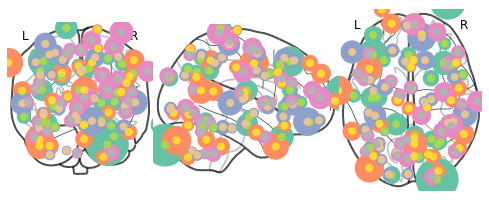

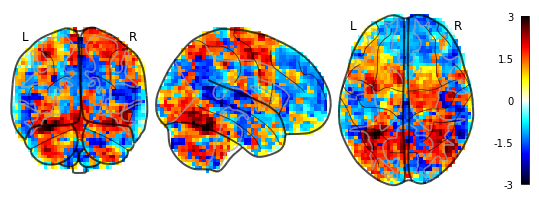

02/03/2020 13:15:13 Reconstruction Error (Frobenius Norm): 9.26014938e+01 out of 6.36484863e+02


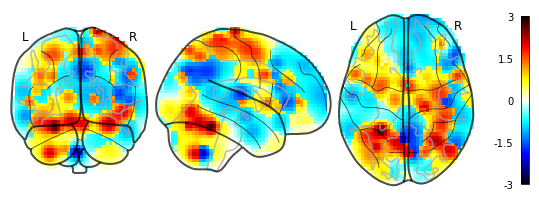

02/03/2020 13:15:14 Reconstruction Error (Frobenius Norm): 9.26014938e+01 out of 6.36484863e+02


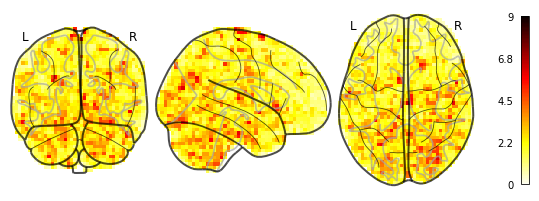

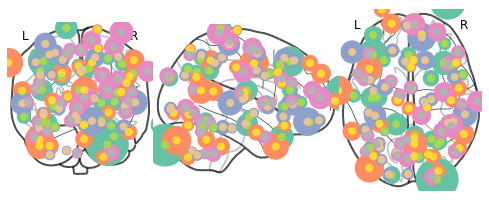

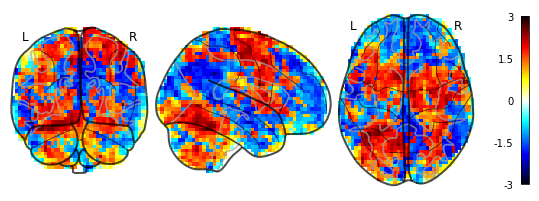

02/03/2020 13:15:18 Reconstruction Error (Frobenius Norm): 9.80419312e+01 out of 6.30872803e+02


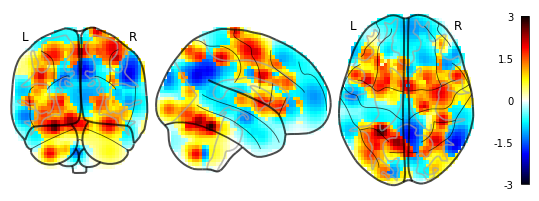

02/03/2020 13:15:19 Reconstruction Error (Frobenius Norm): 9.80419312e+01 out of 6.30872803e+02


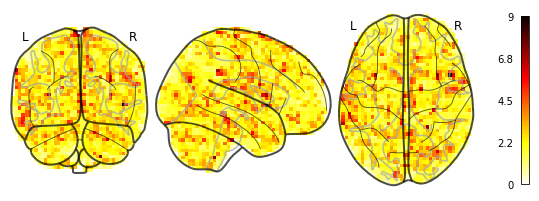

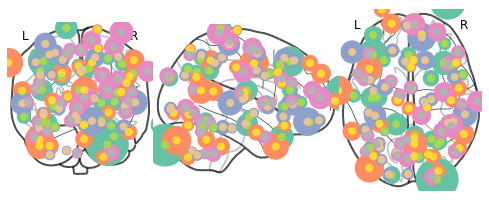

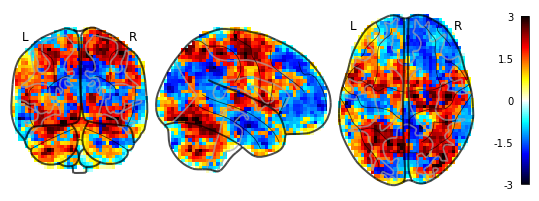

02/03/2020 13:15:23 Reconstruction Error (Frobenius Norm): 9.59287796e+01 out of 6.44300842e+02


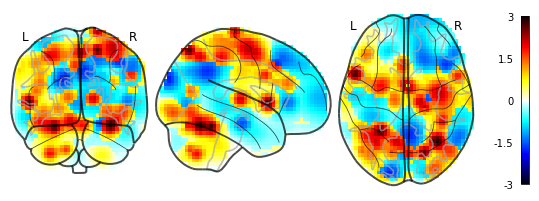

02/03/2020 13:15:24 Reconstruction Error (Frobenius Norm): 9.59287796e+01 out of 6.44300842e+02


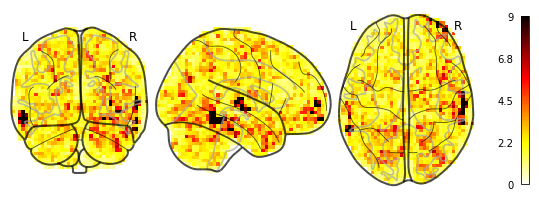

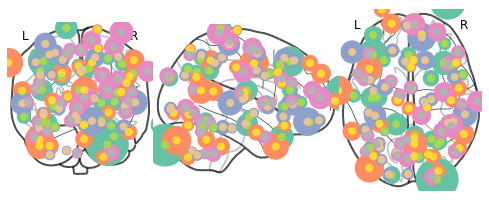

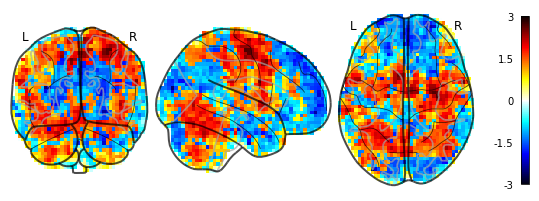

02/03/2020 13:15:28 Reconstruction Error (Frobenius Norm): 8.46620712e+01 out of 6.00198181e+02


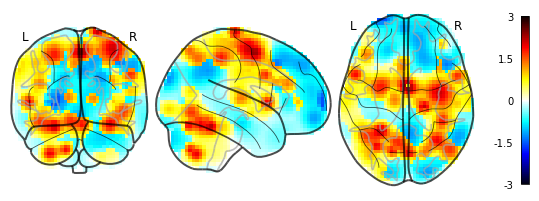

02/03/2020 13:15:29 Reconstruction Error (Frobenius Norm): 8.46620712e+01 out of 6.00198181e+02


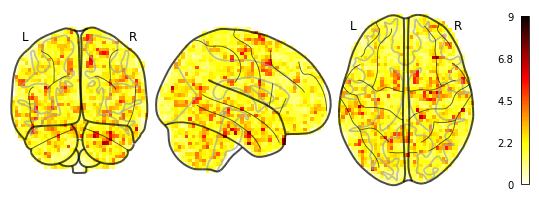

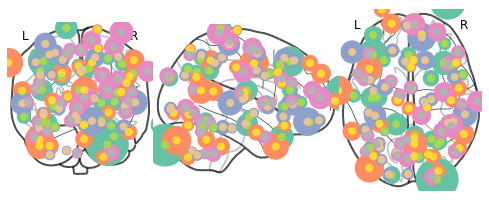

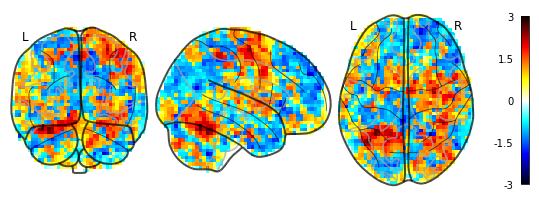

02/03/2020 13:15:33 Reconstruction Error (Frobenius Norm): 7.90900040e+01 out of 5.76843079e+02


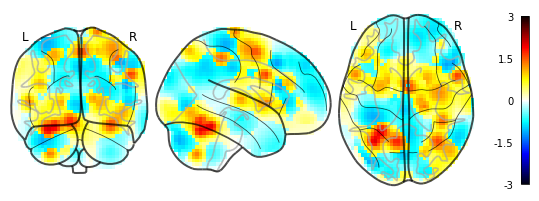

02/03/2020 13:15:34 Reconstruction Error (Frobenius Norm): 7.90900040e+01 out of 5.76843079e+02


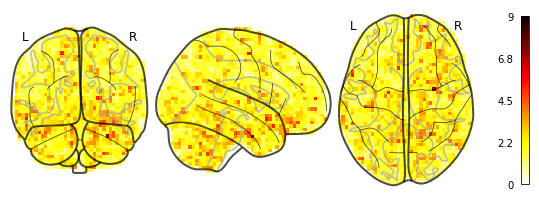

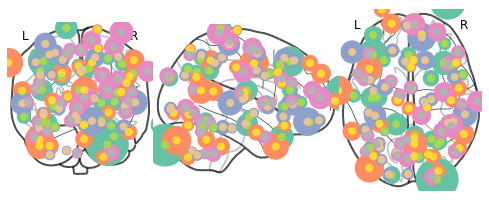

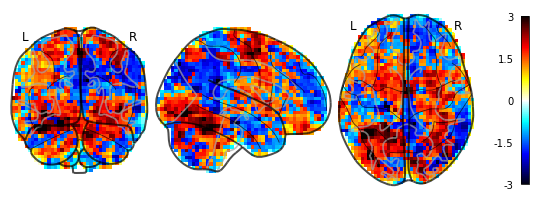

02/03/2020 13:15:38 Reconstruction Error (Frobenius Norm): 1.12951454e+02 out of 6.35086487e+02


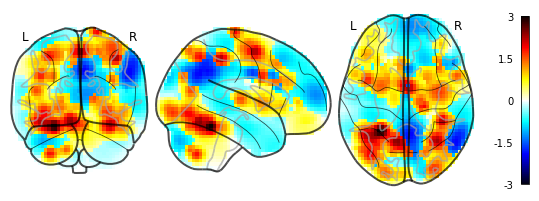

02/03/2020 13:15:39 Reconstruction Error (Frobenius Norm): 1.12951454e+02 out of 6.35086487e+02


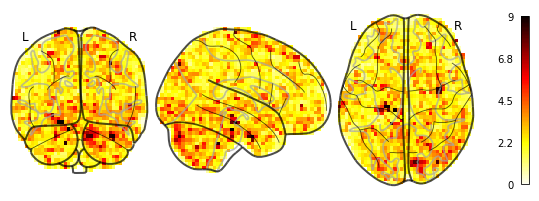

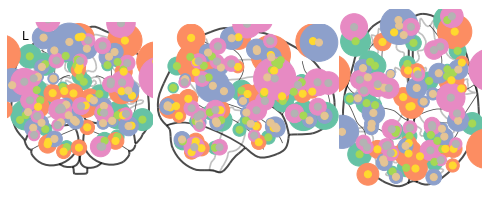

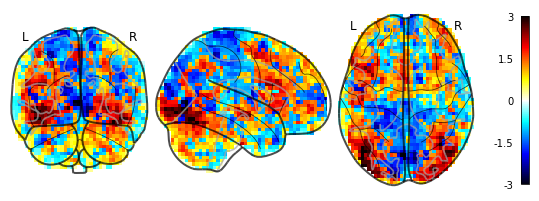

02/03/2020 13:15:42 Reconstruction Error (Frobenius Norm): 9.19957047e+01 out of 6.09614807e+02


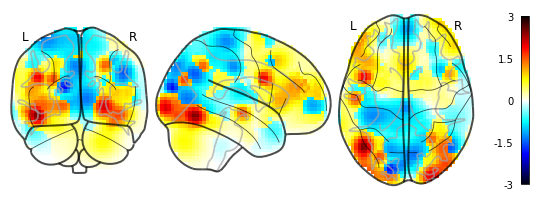

02/03/2020 13:15:44 Reconstruction Error (Frobenius Norm): 9.19957047e+01 out of 6.09614807e+02


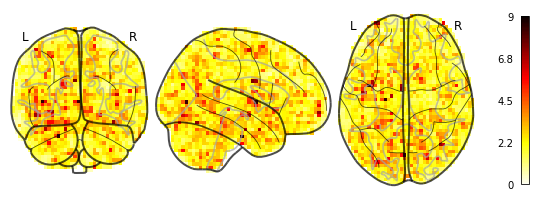

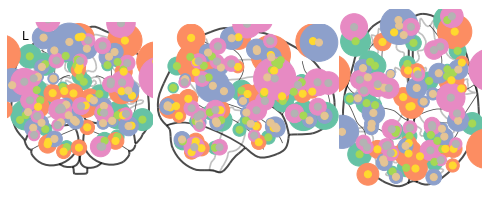

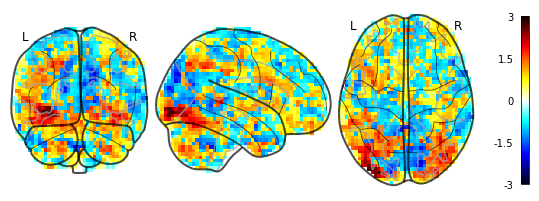

02/03/2020 13:15:47 Reconstruction Error (Frobenius Norm): 7.18140564e+01 out of 5.52729492e+02


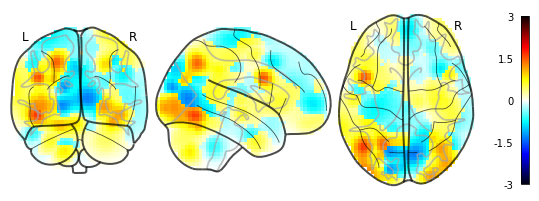

02/03/2020 13:15:49 Reconstruction Error (Frobenius Norm): 7.18140564e+01 out of 5.52729492e+02


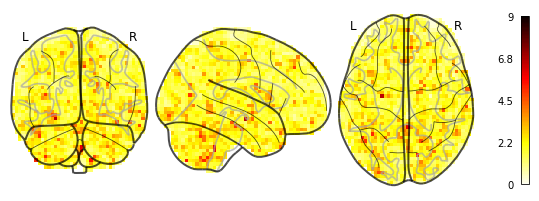

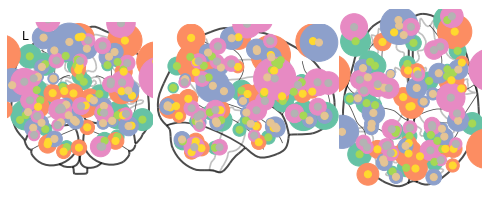

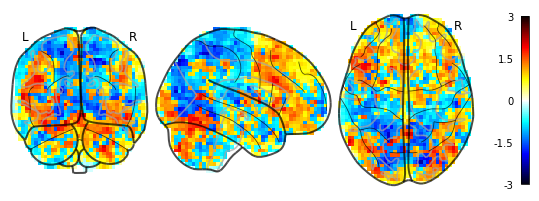

02/03/2020 13:15:52 Reconstruction Error (Frobenius Norm): 8.07958145e+01 out of 5.51140564e+02


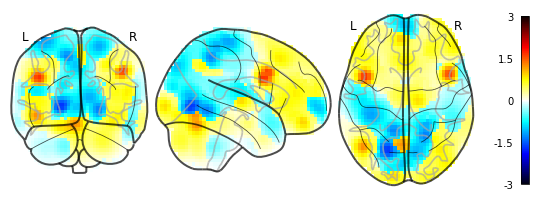

02/03/2020 13:15:53 Reconstruction Error (Frobenius Norm): 8.07958145e+01 out of 5.51140564e+02


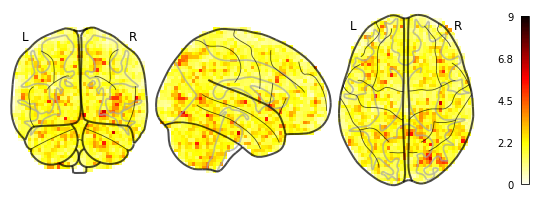

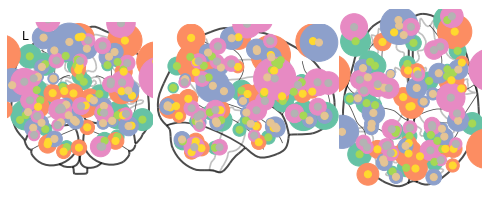

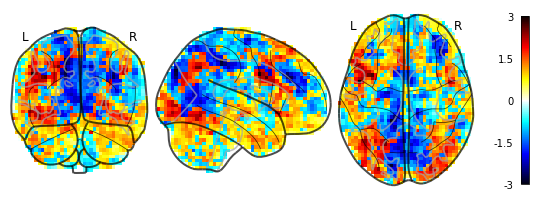

02/03/2020 13:15:57 Reconstruction Error (Frobenius Norm): 8.40289154e+01 out of 5.51951294e+02


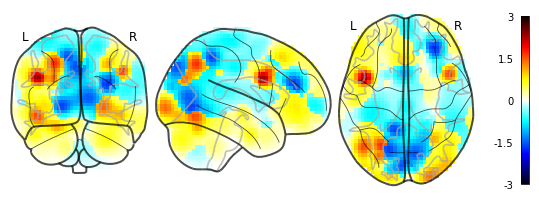

02/03/2020 13:15:58 Reconstruction Error (Frobenius Norm): 8.40289154e+01 out of 5.51951294e+02


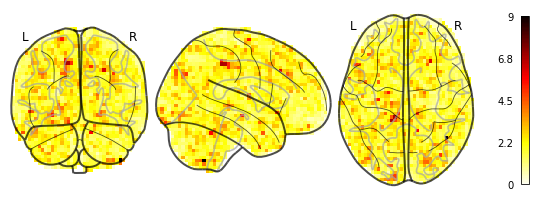

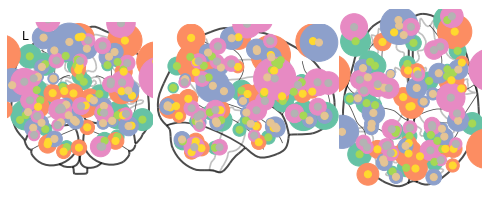

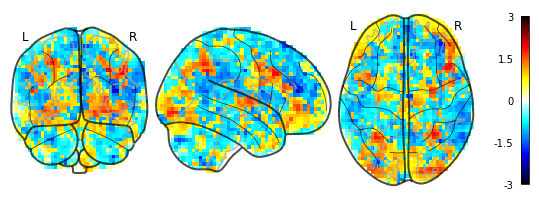

02/03/2020 13:16:01 Reconstruction Error (Frobenius Norm): 7.32383957e+01 out of 5.08276093e+02


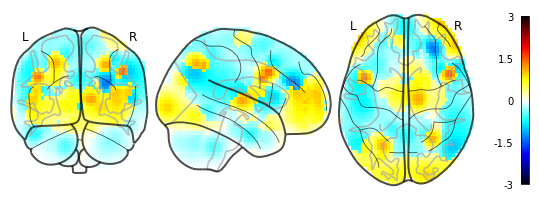

02/03/2020 13:16:02 Reconstruction Error (Frobenius Norm): 7.32383957e+01 out of 5.08276093e+02


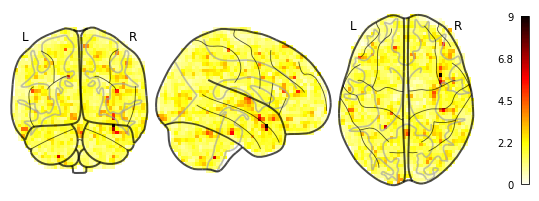

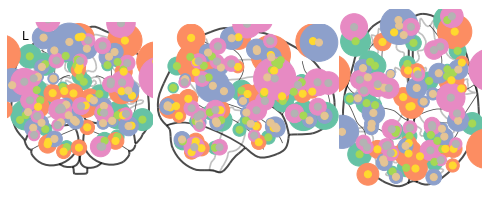

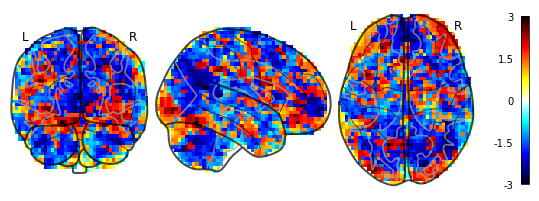

02/03/2020 13:16:06 Reconstruction Error (Frobenius Norm): 1.21507942e+02 out of 6.55966370e+02


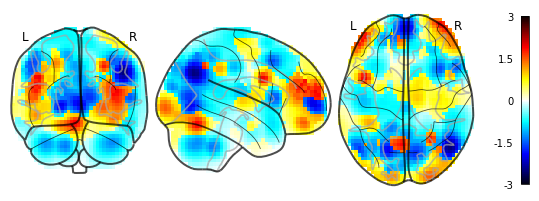

02/03/2020 13:16:07 Reconstruction Error (Frobenius Norm): 1.21507942e+02 out of 6.55966370e+02


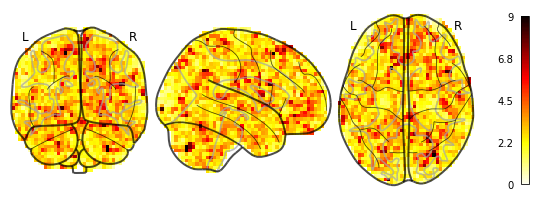

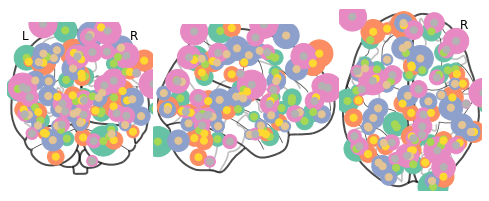

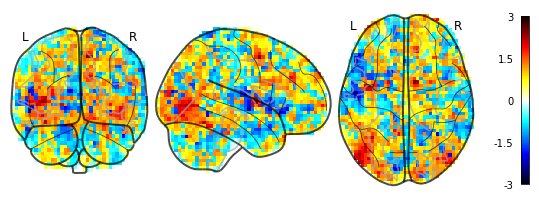

02/03/2020 13:16:10 Reconstruction Error (Frobenius Norm): 8.14937668e+01 out of 5.31463013e+02


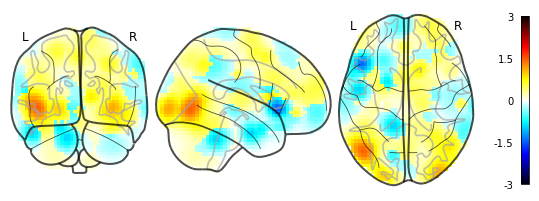

02/03/2020 13:16:12 Reconstruction Error (Frobenius Norm): 8.14937668e+01 out of 5.31463013e+02


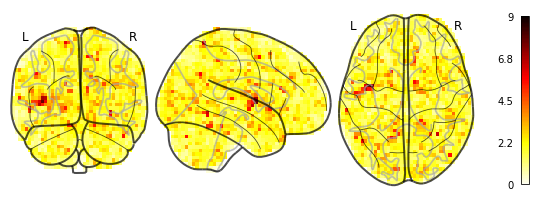

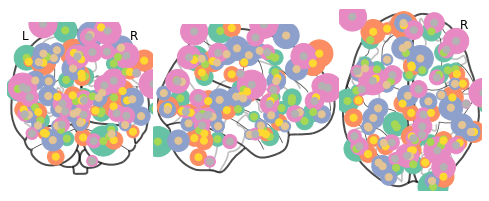

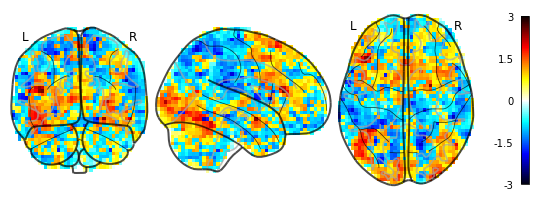

02/03/2020 13:16:15 Reconstruction Error (Frobenius Norm): 7.64737778e+01 out of 5.00539307e+02


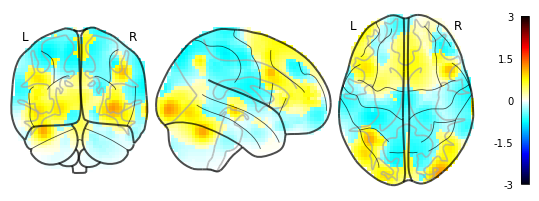

02/03/2020 13:16:16 Reconstruction Error (Frobenius Norm): 7.64737778e+01 out of 5.00539307e+02


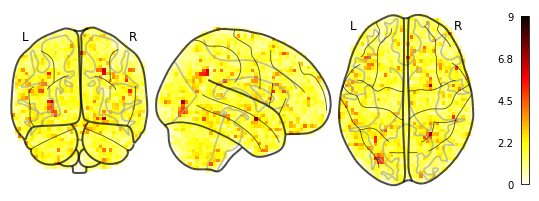

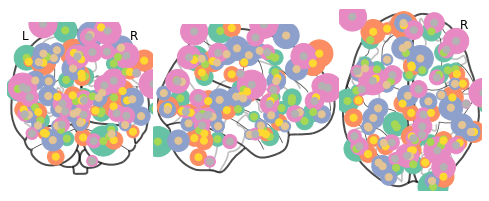

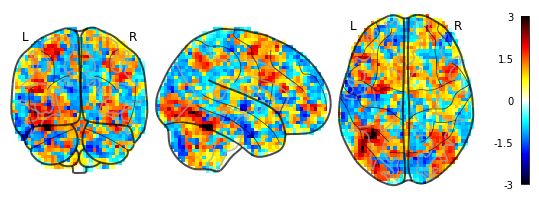

02/03/2020 13:16:19 Reconstruction Error (Frobenius Norm): 8.44459534e+01 out of 5.75106262e+02


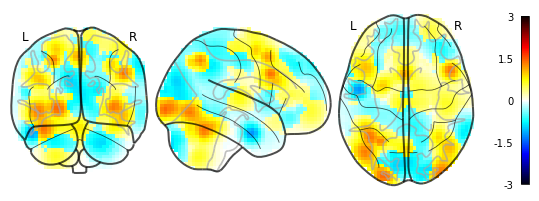

02/03/2020 13:16:21 Reconstruction Error (Frobenius Norm): 8.44459534e+01 out of 5.75106262e+02


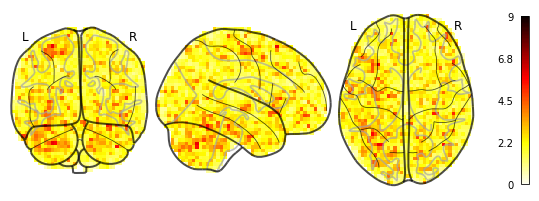

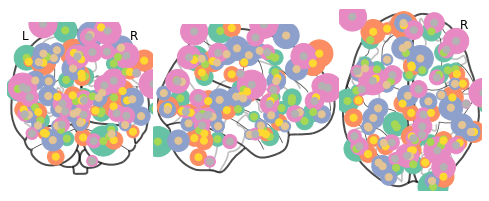

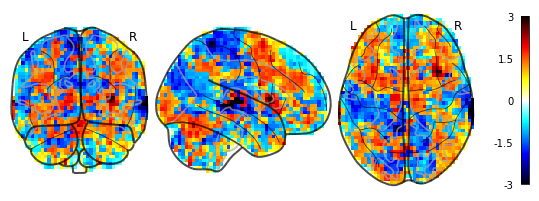

02/03/2020 13:16:24 Reconstruction Error (Frobenius Norm): 9.29796066e+01 out of 5.95553711e+02


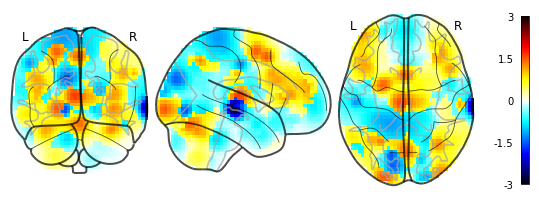

02/03/2020 13:16:25 Reconstruction Error (Frobenius Norm): 9.29796066e+01 out of 5.95553711e+02


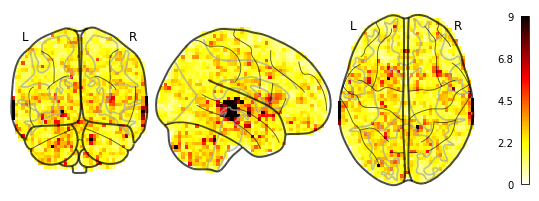

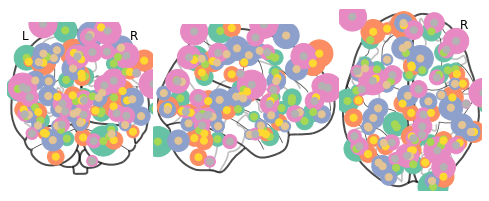

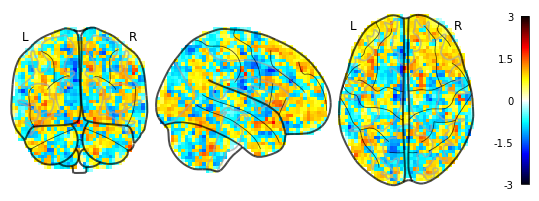

02/03/2020 13:16:29 Reconstruction Error (Frobenius Norm): 7.05253677e+01 out of 4.82947083e+02


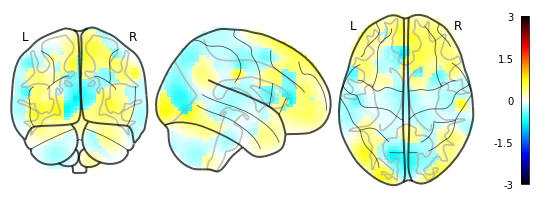

02/03/2020 13:16:30 Reconstruction Error (Frobenius Norm): 7.05253677e+01 out of 4.82947083e+02


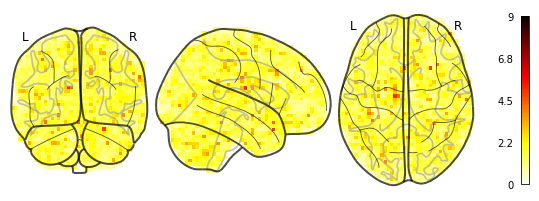

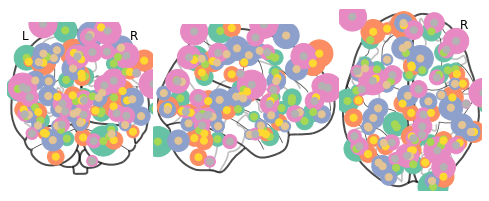

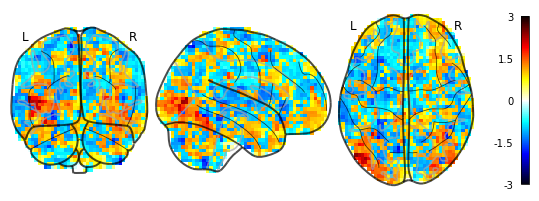

02/03/2020 13:16:33 Reconstruction Error (Frobenius Norm): 8.56158600e+01 out of 5.20422485e+02


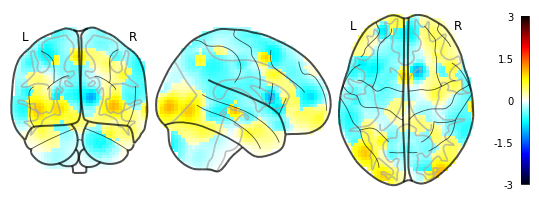

02/03/2020 13:16:35 Reconstruction Error (Frobenius Norm): 8.56158600e+01 out of 5.20422485e+02


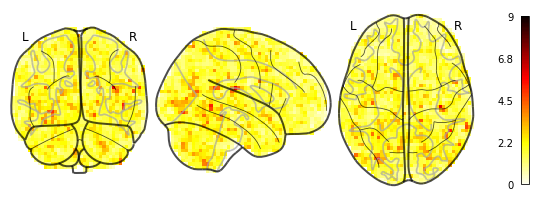

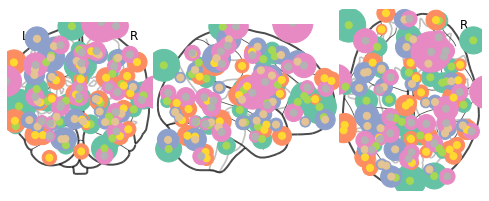

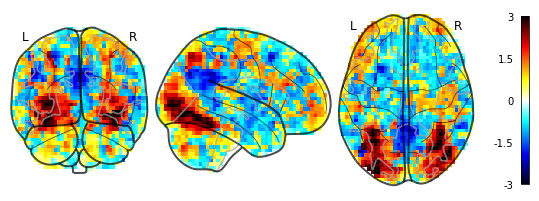

02/03/2020 13:16:38 Reconstruction Error (Frobenius Norm): 7.80540466e+01 out of 5.86504456e+02


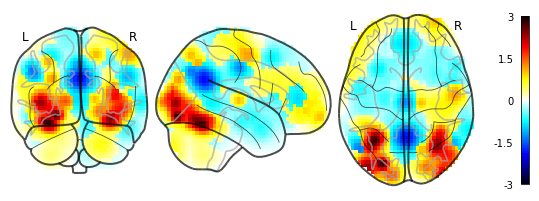

02/03/2020 13:16:39 Reconstruction Error (Frobenius Norm): 7.80540466e+01 out of 5.86504456e+02


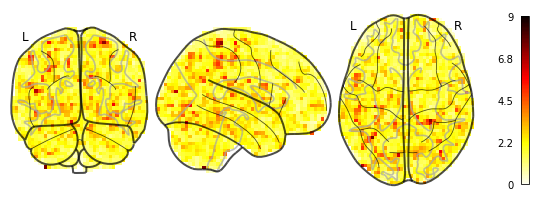

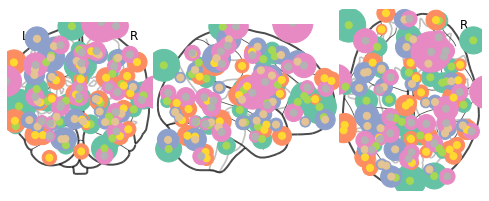

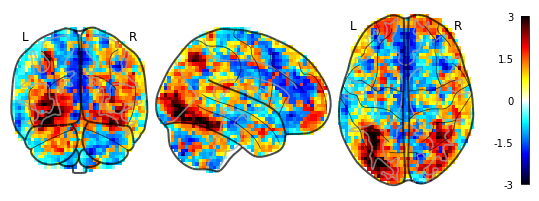

02/03/2020 13:16:43 Reconstruction Error (Frobenius Norm): 8.94293365e+01 out of 6.15271362e+02


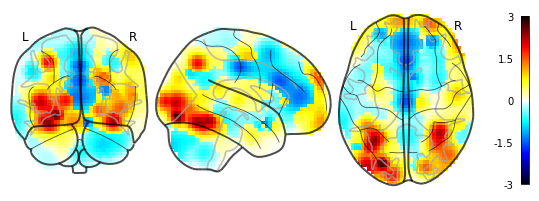

02/03/2020 13:16:44 Reconstruction Error (Frobenius Norm): 8.94293365e+01 out of 6.15271362e+02


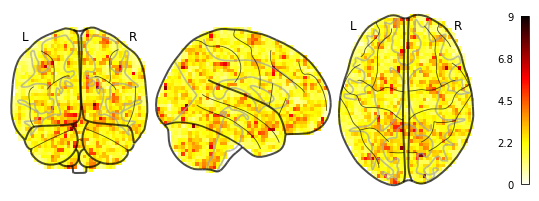

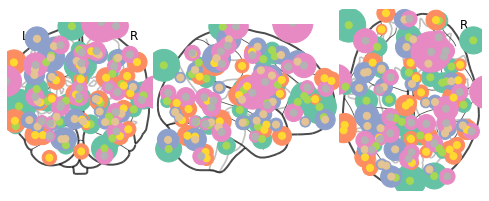

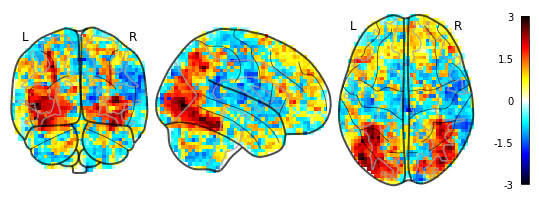

02/03/2020 13:16:47 Reconstruction Error (Frobenius Norm): 7.53537140e+01 out of 5.70584106e+02


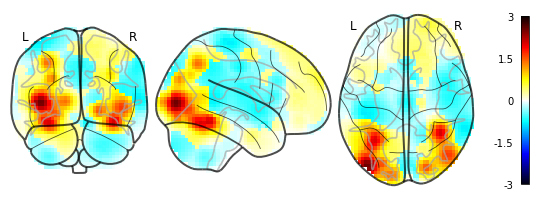

02/03/2020 13:16:49 Reconstruction Error (Frobenius Norm): 7.53537140e+01 out of 5.70584106e+02


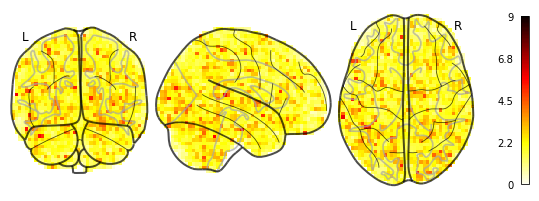

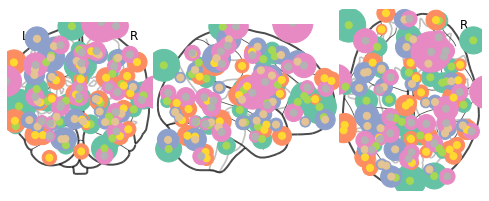

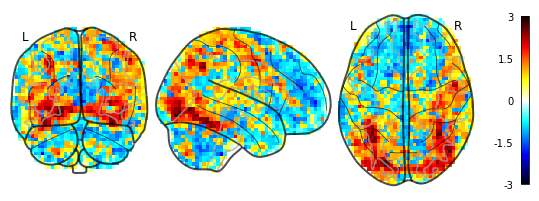

02/03/2020 13:16:52 Reconstruction Error (Frobenius Norm): 7.92879257e+01 out of 5.70172791e+02


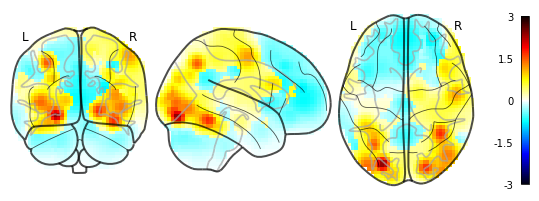

02/03/2020 13:16:53 Reconstruction Error (Frobenius Norm): 7.92879257e+01 out of 5.70172791e+02


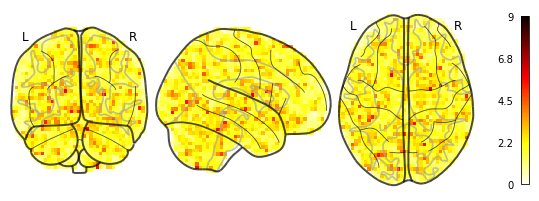

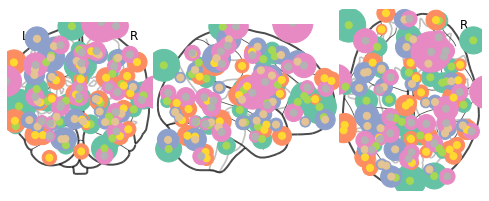

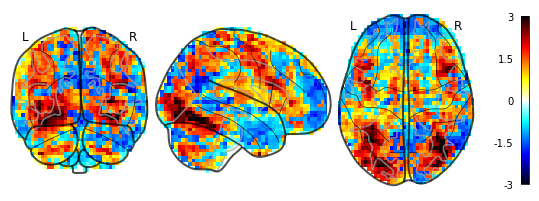

02/03/2020 13:16:57 Reconstruction Error (Frobenius Norm): 9.58084412e+01 out of 6.12698792e+02


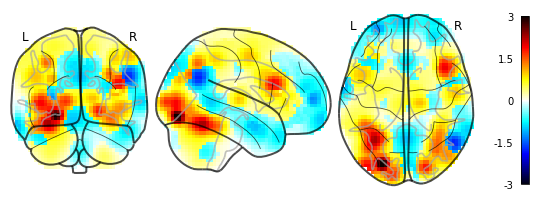

02/03/2020 13:16:58 Reconstruction Error (Frobenius Norm): 9.58084412e+01 out of 6.12698792e+02


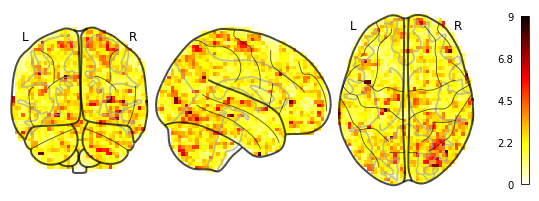

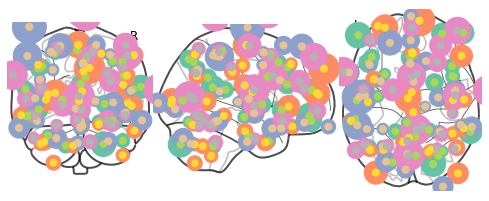

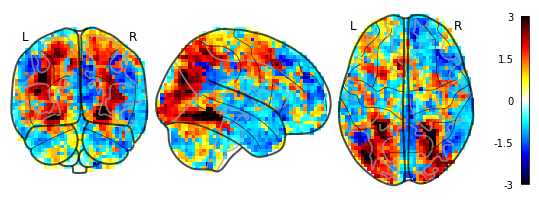

02/03/2020 13:17:01 Reconstruction Error (Frobenius Norm): 9.14236984e+01 out of 6.04306580e+02


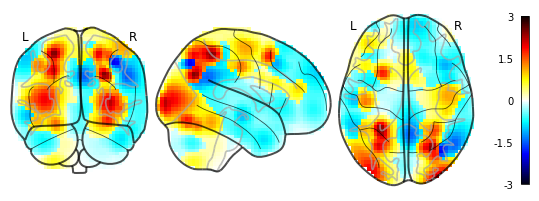

02/03/2020 13:17:03 Reconstruction Error (Frobenius Norm): 9.14236984e+01 out of 6.04306580e+02


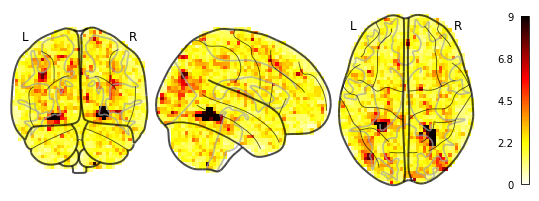

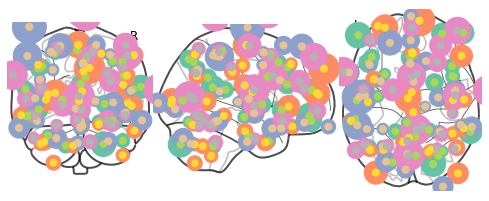

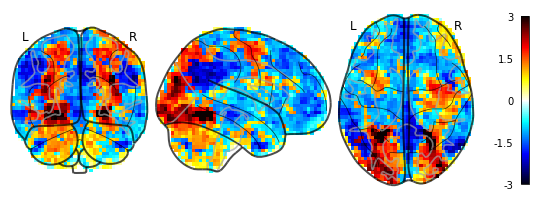

02/03/2020 13:17:06 Reconstruction Error (Frobenius Norm): 9.25781021e+01 out of 6.05236023e+02


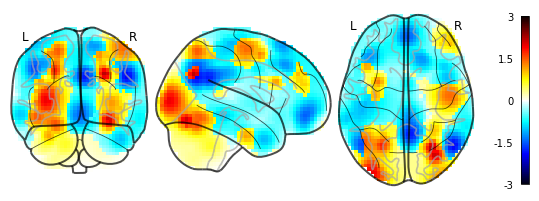

02/03/2020 13:17:07 Reconstruction Error (Frobenius Norm): 9.25781021e+01 out of 6.05236023e+02


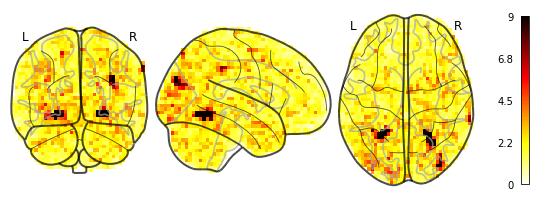

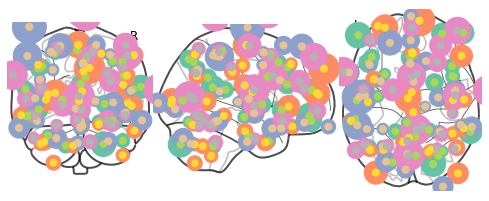

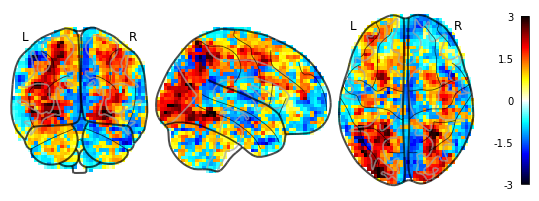

02/03/2020 13:17:11 Reconstruction Error (Frobenius Norm): 8.80205383e+01 out of 5.82021851e+02


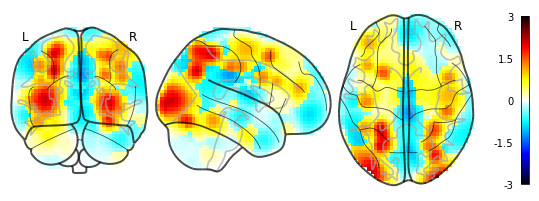

02/03/2020 13:17:12 Reconstruction Error (Frobenius Norm): 8.80205383e+01 out of 5.82021851e+02


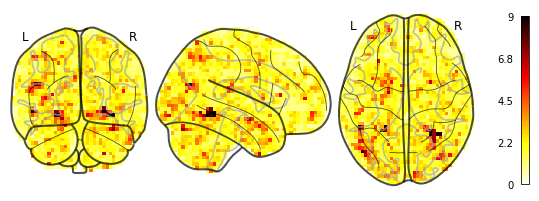

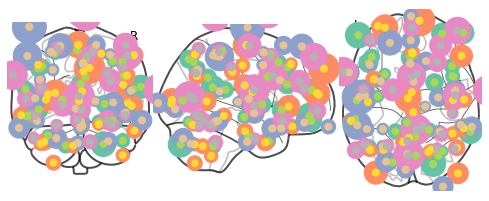

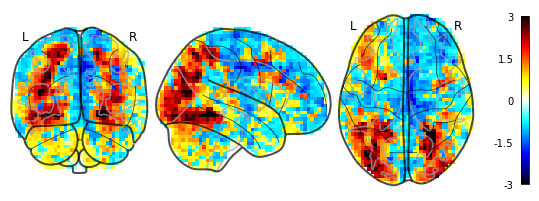

02/03/2020 13:17:15 Reconstruction Error (Frobenius Norm): 7.79948349e+01 out of 5.83054688e+02


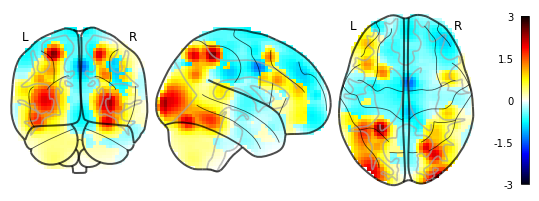

02/03/2020 13:17:16 Reconstruction Error (Frobenius Norm): 7.79948349e+01 out of 5.83054688e+02


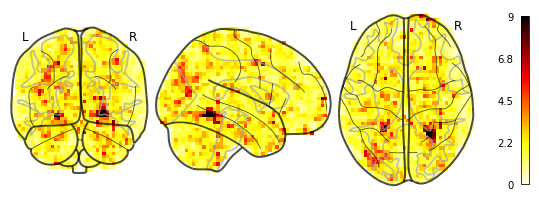

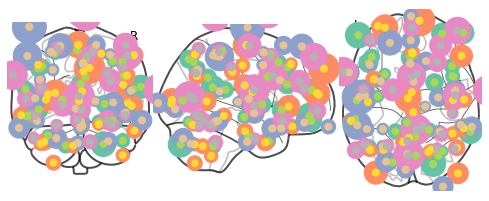

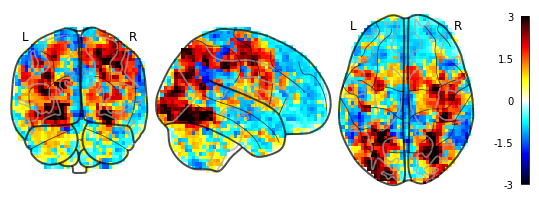

02/03/2020 13:17:20 Reconstruction Error (Frobenius Norm): 8.81218414e+01 out of 5.96572021e+02


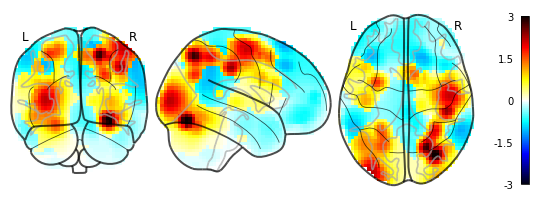

02/03/2020 13:17:21 Reconstruction Error (Frobenius Norm): 8.81218414e+01 out of 5.96572021e+02


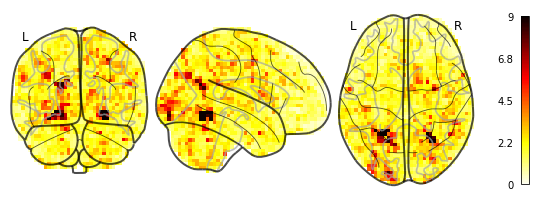

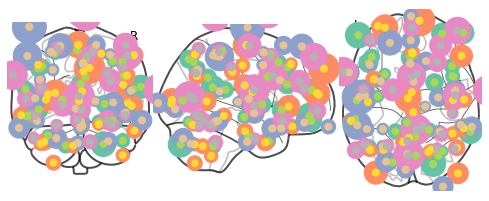

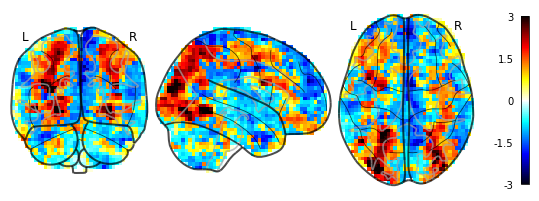

02/03/2020 13:17:24 Reconstruction Error (Frobenius Norm): 8.90830841e+01 out of 5.97426270e+02


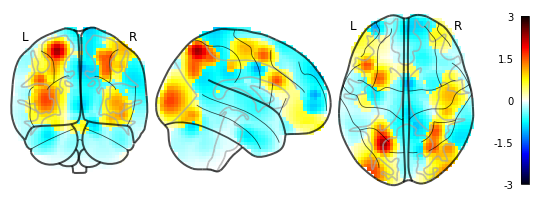

02/03/2020 13:17:25 Reconstruction Error (Frobenius Norm): 8.90830841e+01 out of 5.97426270e+02


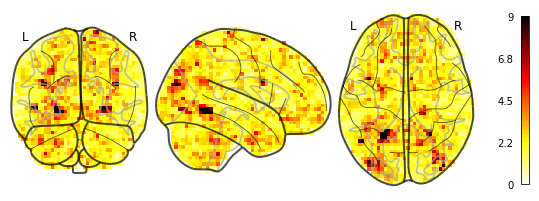

In [16]:
for index in validation_blocks[0:-1:2]:
    dtfa.plot_factor_centers(index)
    dtfa.plot_original_brain(index, labeler=lambda b: None, t=None)
    dtfa.plot_reconstruction(index, labeler=lambda b: None, t=None)
    dtfa.plot_reconstruction_diff(index, labeler=lambda b: None, t=None)

In [17]:
def task_labeler(task):
    return task.capitalize()

def rest_task_labeler(task):
    if task == 'rest':
        return 'Rest'
    else:
        return 'Task'

def animacy_task_labeler(task):
    if task in ['cat', 'face']:
        return 'Animate'
    if task == 'scrambledpix':
        return 'Scrambled'
    return 'Inanimate'

def faces_objects_task_labeler(task):
    if task == 'face':
        return 'Faces'
    if task == 'scrambledpix':
        return 'Scrambled'
    return 'Objects'

def faces_houses_task_labeler(task):
    if task == 'face':
        return 'Faces'
    if task == 'house':
        return 'Houses'
    if task == 'scrambledpix':
        return 'Scrambled'
    return 'Other'

In [18]:
def block_task_labeler(block):
    return task_labeler(block.task)

/home/eli/AnacondaProjects/HTFATorch/htfa_torch/utils.py:149: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


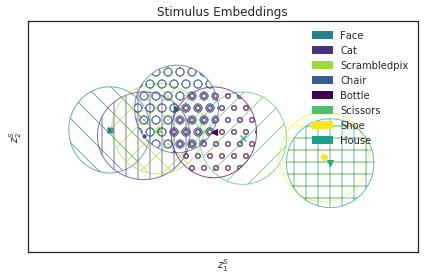

In [19]:
dtfa.scatter_task_embedding(labeler=task_labeler, figsize=None,
                            filename='haxby_norest_task_embedding.pdf')

/home/eli/AnacondaProjects/HTFATorch/htfa_torch/utils.py:149: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


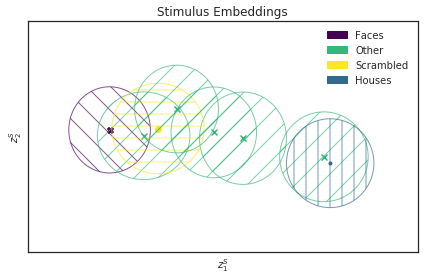

In [20]:
dtfa.scatter_task_embedding(labeler=faces_houses_task_labeler, figsize=None,
                            filename='haxby_norest_faces_houses_other_task_embedding.pdf')

/home/eli/AnacondaProjects/HTFATorch/htfa_torch/utils.py:149: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


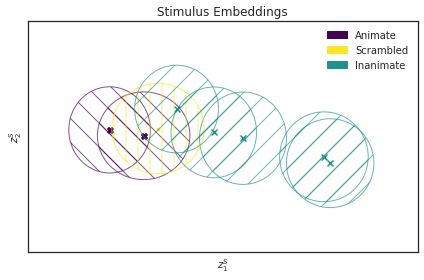

In [21]:
dtfa.scatter_task_embedding(labeler=animacy_task_labeler, figsize=None,
                            filename='haxby_norest_animacy_task_embedding.pdf')

/home/eli/AnacondaProjects/HTFATorch/htfa_torch/utils.py:149: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


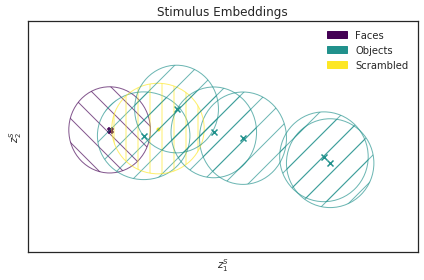

In [22]:
dtfa.scatter_task_embedding(labeler=faces_objects_task_labeler, figsize=None,
                            filename='haxby_norest_faces_objects_task_embedding.pdf')

In [23]:
def subject_labeler(subject):
    return 'Subject %d' % subject

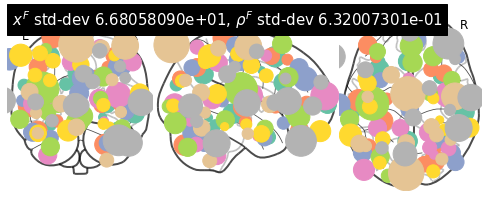

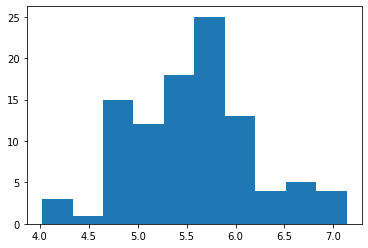

(<nilearn.plotting.displays.OrthoProjector at 0x7f204dca4b90>,
 tensor([[-59.1367, -29.2194,  21.4442],
         [ 39.2189, -58.3045, -23.9712],
         [ 43.7437,   1.7837,  37.5838],
         [ 27.6492,  70.9816,   1.7655],
         [ -2.4840, -59.3962,  33.5651],
         [-31.9244,  24.4137,   4.5370],
         [-31.4317, -47.1888, -20.4336],
         [-32.7654,  15.7666,  51.9928],
         [ 57.2983, -28.8695,  -7.9563],
         [ 23.6488, -54.2106, -12.2636],
         [ -2.2625,  24.5962,  24.7943],
         [-15.1710, -88.0433,  22.3995],
         [ 32.4241,   8.5524, -32.3763],
         [-24.4350, -15.1639, -16.3547],
         [ 29.0635, -64.5285,  40.4874],
         [-44.3105, -66.4550,  40.6523],
         [ 42.3348,  48.9860,   2.3089],
         [ 22.3232,  16.2415,   0.5132],
         [ 26.0289, -79.7287, -40.9595],
         [-44.4848,  41.6836, -26.0483],
         [-53.7426, -16.5805,  -0.1905],
         [ 35.7248,  12.0035,  52.5273],
         [-29.1168, -38.3610,  71.6

In [24]:
dtfa.visualize_factor_embedding()

/home/eli/AnacondaProjects/HTFATorch/htfa_torch/utils.py:149: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


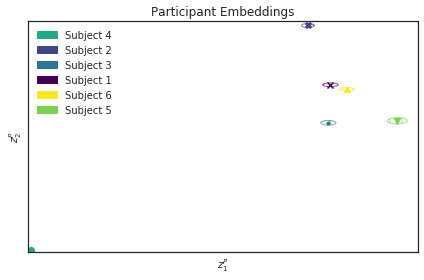

In [25]:
dtfa.scatter_subject_embedding(labeler=subject_labeler, figsize=None)

In [26]:
def subject_task_blocks(subject_label, task_label, subject_labeler=subject_labeler, task_labeler=task_labeler):
    for b in dtfa._blocks:
        if subject_labeler(b.subject) == subject_label and task_labeler(b.task) == task_label:
            yield b

In [27]:
def subject_blocks(subject_label, subject_labeler=subject_labeler):
    for b in dtfa._blocks:
        if subject_labeler(b.subject) == subject_label:
            yield b

In [28]:
### this is still Work in Progress ###
from scipy.spatial import distance
hyperparams = dtfa.variational.hyperparams.state_vardict()
all_weights = hyperparams['weights']['mu'].data.numpy()
all_factor_centers = hyperparams['factor_centers']['mu'].data.numpy()
all_factor_widths = np.exp(hyperparams['factor_log_widths']['mu'].data.numpy())
face_matrix = []
house_matrix = []
for i in range(dtfa.num_blocks):
    if block_task_labeler(dtfa._blocks[i]) == 'face':
        face_matrix.append(np.corrcoef(all_weights[i,:,:].T))
    elif  block_task_labeler(dtfa._blocks[i]) == 'house':
        house_matrix.append(np.corrcoef(all_weights[i,:,:].T))

face_matrix = (np.array(face_matrix))
house_matrix = (np.array(house_matrix))

face_matrix[face_matrix < 0] = 0
house_matrix[house_matrix < 0] = 0

face_vectors = np.zeros(shape=(face_matrix.shape[0],4950))
for i in range(face_matrix.shape[0]):
    face_vectors[i,:] = distance.squareform(face_matrix[i,:,:],checks=False)

house_vectors = np.zeros(shape=(house_matrix.shape[0],4950))
for i in range(house_matrix.shape[0]):
    house_vectors[i,:] = distance.squareform(house_matrix[i,:,:],checks=False)
    
face_vectors_mean = face_vectors.mean(0)
house_vectors_std = house_vectors.std(0)


/home/eli/anaconda3/envs/HTFATorch/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: Mean of empty slice.
/home/eli/anaconda3/envs/HTFATorch/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)


In [29]:
### face vs house ###
p_original = []
t_original = []
significance_flags = np.zeros(4950,)
for i in range(4950):
    t,p = stats.ttest_ind(face_vectors[:,i],house_vectors[:,i])
    p_original.append(p)
    t_original.append(t)
p_corrected = smt.multipletests(p_original,method='fdr_by')[1]
for i in range(4950):
    if p_corrected[i] < 0.05 and t_original[i]>0:
        significance_flags[i] = 1
significant_edges = significance_flags.sum()
significance_flags =distance.squareform(significance_flags)
use_factors = np.where(significance_flags.sum(0) > 0)[0]
node_sizes = np.zeros(100,)
node_sizes[use_factors] = all_factor_widths[0,use_factors]
face_connectome = distance.squareform(face_vectors_mean) * significance_flags
if significant_edges > 0:
    niplot.plot_connectome(face_connectome,all_factor_centers[0,:,:],node_size=node_sizes,
                       colorbar=True,title='spider-heights-'+str(significant_edges))#,edge_threshold="75%")
else:
    print('no significant edges found')

no significant edges found


In [30]:
### task classification using leave one out runs ###
from sklearn.svm import SVC
classifier = SVC(C=1., kernel="linear")

# A classifier to set the chance level
from sklearn.dummy import DummyClassifier
dummy_classifier = DummyClassifier()

# Make a data splitting object for cross validation
from sklearn.model_selection import LeaveOneGroupOut, cross_val_score
cv = LeaveOneGroupOut()

for s in dtfa.subjects():
    print("Processing Subject %d" % (s))
    session_labels = []
    data = []
    targets = []
    for i in range(dtfa.num_blocks):
        block = dtfa._blocks[i]
        if block.subject == s:
            session_labels.append(block.run)
            data.append(all_weights[i,:,:].mean(0))
            targets.append(task_labeler(block.task))
    data = np.array(data)
    categories = np.unique(targets)

    for category in categories:
        print("Processing %s" % (category))
        classification_target = [t==category for t in targets]
        result = cross_val_score(
            classifier,
            data,
            classification_target,
            cv=cv,
            groups=session_labels,
#             scoring="roc_auc",
        )

        result_chance = cross_val_score(
            dummy_classifier,
            data,
            classification_target,
            cv=cv,
            groups=session_labels,
#             scoring="roc_auc",
        )

        print("Scores: %1.2f +- %1.2f" % (
            result.mean(),
            result.std()))

        print("Chance Scores: %1.2f +- %1.2f" % (
            result_chance.mean(),
            result_chance.std()))
        
    print ("\n")

Processing Subject 1
Processing Bottle
Scores: 0.83 +- 0.17
Chance Scores: 0.77 +- 0.13
Processing Cat
Scores: 0.88 +- 0.08
Chance Scores: 0.78 +- 0.09
Processing Chair
Scores: 0.92 +- 0.08
Chance Scores: 0.82 +- 0.15
Processing Face
Scores: 0.94 +- 0.08
Chance Scores: 0.78 +- 0.06
Processing House
Scores: 0.99 +- 0.04
Chance Scores: 0.84 +- 0.08
Processing Scissors
Scores: 0.89 +- 0.08
Chance Scores: 0.76 +- 0.11
Processing Scrambledpix
Scores: 0.95 +- 0.06
Chance Scores: 0.80 +- 0.08
Processing Shoe
Scores: 0.89 +- 0.10
Chance Scores: 0.76 +- 0.08


Processing Subject 2
Processing Bottle
Scores: 0.84 +- 0.12
Chance Scores: 0.73 +- 0.11
Processing Cat
Scores: 0.91 +- 0.09
Chance Scores: 0.79 +- 0.09
Processing Chair
Scores: 0.83 +- 0.11
Chance Scores: 0.76 +- 0.08
Processing Face
Scores: 0.96 +- 0.06
Chance Scores: 0.75 +- 0.14
Processing House
Scores: 0.97 +- 0.05
Chance Scores: 0.81 +- 0.08
Processing Scissors
Scores: 0.96 +- 0.06
Chance Scores: 0.81 +- 0.10
Processing Scrambledpix


In [31]:
data = all_weights.mean(1)
targets = []
subject_labels = []
session_labels = []
for i in range(dtfa.num_blocks):
    block = dtfa._blocks[i]
    session_labels.append(block.run)
    targets.append(task_labeler(block.task))
    subject_labels.append(block.subject)
categories = np.unique(targets)
for category in categories:
    print("Processing %s" % (category))
    classification_target = [t==category for t in targets]
    result = cross_val_score(
        classifier,
        data,
        classification_target,
        cv=cv,
        groups=subject_labels,
#         scoring="roc_auc",
    )

    result_chance = cross_val_score(
        dummy_classifier,
        data,
        classification_target,
        cv=cv,
        groups=subject_labels,
#         scoring="roc_auc",
    )

    print("Scores: %1.2f +- %1.2f" % (
        result.mean(),
        result.std()))

    print("Chance Scores: %1.2f +- %1.2f" % (
        result_chance.mean(),
        result_chance.std()))

Processing Bottle
Scores: 0.75 +- 0.22
Chance Scores: 0.78 +- 0.02
Processing Cat
Scores: 0.59 +- 0.29
Chance Scores: 0.78 +- 0.02
Processing Chair
Scores: 0.67 +- 0.22
Chance Scores: 0.77 +- 0.03
Processing Face
Scores: 0.65 +- 0.31
Chance Scores: 0.78 +- 0.03
Processing House
Scores: 0.81 +- 0.12
Chance Scores: 0.77 +- 0.03
Processing Scissors
Scores: 0.65 +- 0.20
Chance Scores: 0.79 +- 0.03
Processing Scrambledpix
Scores: 0.86 +- 0.06
Chance Scores: 0.79 +- 0.04
Processing Shoe
Scores: 0.78 +- 0.12
Chance Scores: 0.79 +- 0.02


In [32]:
from sklearn.feature_selection import SelectPercentile, f_classif
feature_selection = SelectPercentile(f_classif, percentile=5)
from sklearn.pipeline import Pipeline
svc = SVC(C=1., kernel="linear")
classifier = Pipeline([('anova', feature_selection), ('svc', svc)])
data = all_weights.mean(1)
targets = []
subject_labels = []
session_labels = []
data = []
for i in range(dtfa.num_blocks):
    block = dtfa._blocks[i]
    session_labels.append(block.run)
    targets.append(task_labeler(block.task))
    data.append(dtfa.voxel_activations[i].data.numpy().mean(0))
    subject_labels.append(block.subject)
categories = np.unique(targets)
for category in categories:
    print("Processing %s" % (category))
    classification_target = [t==category for t in targets]
    result = cross_val_score(
        classifier,
        data,
        classification_target,
        cv=cv,
        groups=subject_labels,
#         scoring="roc_auc",
    )

    result_chance = cross_val_score(
        dummy_classifier,
        data,
        classification_target,
        cv=cv,
        groups=subject_labels,
#         scoring="roc_auc",
    )

    print("Scores: %1.2f +- %1.2f" % (
        result.mean(),
        result.std()))

    print("Chance Scores: %1.2f +- %1.2f" % (
        result_chance.mean(),
        result_chance.std()))

Processing Bottle
Scores: 0.84 +- 0.04
Chance Scores: 0.79 +- 0.02
Processing Cat
Scores: 0.79 +- 0.13
Chance Scores: 0.77 +- 0.01
Processing Chair
Scores: 0.79 +- 0.11
Chance Scores: 0.77 +- 0.02
Processing Face
Scores: 0.86 +- 0.03
Chance Scores: 0.78 +- 0.01
Processing House
Scores: 0.94 +- 0.03
Chance Scores: 0.80 +- 0.03
Processing Scissors
Scores: 0.85 +- 0.07
Chance Scores: 0.80 +- 0.03
Processing Scrambledpix
Scores: 0.93 +- 0.02
Chance Scores: 0.80 +- 0.04
Processing Shoe
Scores: 0.83 +- 0.08
Chance Scores: 0.78 +- 0.04


In [33]:
for s in dtfa.subjects():
    print("Processing Subject %d" % (s))
    session_labels = []
    data = []
    targets = []
    for i in range(dtfa.num_blocks):
        block = dtfa._blocks[i]
        if block.subject == s:
            session_labels.append(block.run)
            data.append(dtfa.voxel_activations[i].data.numpy().mean(0))
            targets.append(task_labeler(block.task))
    data = np.array(data)
    categories = np.unique(targets)

    for category in categories:
        print("Processing %s" % (category))
        classification_target = [t==category for t in targets]
        result = cross_val_score(
            classifier,
            data,
            classification_target,
            cv=cv,
            groups=session_labels,
#             scoring="roc_auc",
        )

        result_chance = cross_val_score(
            dummy_classifier,
            data,
            classification_target,
            cv=cv,
            groups=session_labels,
#             scoring="roc_auc",
        )

        print("Scores: %1.2f +- %1.2f" % (
            result.mean(),
            result.std()))

        print("Chance Scores: %1.2f +- %1.2f" % (
            result_chance.mean(),
            result_chance.std()))
        
    print ("\n")

Processing Subject 1
Processing Bottle
Scores: 0.90 +- 0.10
Chance Scores: 0.78 +- 0.09
Processing Cat
Scores: 0.92 +- 0.08
Chance Scores: 0.78 +- 0.11
Processing Chair
Scores: 0.91 +- 0.06
Chance Scores: 0.78 +- 0.11
Processing Face
Scores: 0.98 +- 0.05
Chance Scores: 0.72 +- 0.09
Processing House
Scores: 1.00 +- 0.00
Chance Scores: 0.78 +- 0.08
Processing Scissors
Scores: 0.88 +- 0.00
Chance Scores: 0.82 +- 0.10
Processing Scrambledpix
Scores: 0.95 +- 0.06
Chance Scores: 0.78 +- 0.08
Processing Shoe
Scores: 0.90 +- 0.07
Chance Scores: 0.77 +- 0.10


Processing Subject 2
Processing Bottle
Scores: 0.91 +- 0.05
Chance Scores: 0.73 +- 0.12
Processing Cat
Scores: 0.91 +- 0.07
Chance Scores: 0.82 +- 0.08
Processing Chair
Scores: 0.90 +- 0.07
Chance Scores: 0.83 +- 0.08
Processing Face
Scores: 0.95 +- 0.06
Chance Scores: 0.74 +- 0.15
Processing House
Scores: 1.00 +- 0.00
Chance Scores: 0.78 +- 0.09
Processing Scissors
Scores: 0.88 +- 0.09
Chance Scores: 0.75 +- 0.11
Processing Scrambledpix
